# ETL

## Libraries import

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

## Overview

In [3]:
df = pd.read_csv('data/movies_dataset.csv')

C:\Users\Administrador\AppData\Local\Temp\ipykernel_11920\1052406530.py:1: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('data/movies_dataset.csv')


In [4]:
df.iloc[:,0:15].head()

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,"[{'name': 'Pixar Animation Studios', 'id': 3}]","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-10-30
1,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,"[{'name': 'TriStar Pictures', 'id': 559}, {'na...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-15
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,11.7129,/6ksm1sjKMFLbO7UY2i6G1ju9SML.jpg,"[{'name': 'Warner Bros.', 'id': 6194}, {'name'...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22
3,False,NaN,16000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",3.859495,/16XOMpEaLWkrcPqSQqhTmeJuqQl.jpg,[{'name': 'Twentieth Century Fox Film Corporat...,"[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",0,"[{'id': 35, 'name': 'Comedy'}]",NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,8.387519,/e64sOI48hQXyru7naBFyssKFxVd.jpg,"[{'name': 'Sandollar Productions', 'id': 5842}...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-02-10


In [5]:
df.iloc[:,15:24].head()

,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
0,373554033.0,81.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Toy Story,False,7.7,5415.0
1,262797249.0,104.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0
2,0.0,101.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0
3,81452156.0,127.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34.0
4,76578911.0,106.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45466 entries, 0 to 45465
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   adult                  45466 non-null  object 
 1   belongs_to_collection  4494 non-null   object 
 2   budget                 45466 non-null  object 
 3   genres                 45466 non-null  object 
 4   homepage               7782 non-null   object 
 5   id                     45466 non-null  object 
 6   imdb_id                45449 non-null  object 
 7   original_language      45455 non-null  object 
 8   original_title         45466 non-null  object 
 9   overview               44512 non-null  object 
 10  popularity             45461 non-null  object 
 11  poster_path            45080 non-null  object 
 12  production_companies   45463 non-null  object 
 13  production_countries   45463 non-null  object 
 14  release_date           45379 non-null  object 
 15  re

Observations:
- The columns **belongs_to_collection**, **homepage** and **tagline** have a considerable amount of null values.
- The following columns have nested values: **belongs_to_collection	**, **genres**,**production_companies**,**production_countries**,**spoken_languages**.

## Rearenge rows in columns displaced

In [7]:
#Mask to filter the values in release_time that do NOT contain '-' in their value
mask = df['release_date'].str.contains(r'-', na=True).map({True: False, False: True})
#Row index of the mask
displace_col_indx = df[mask].index
#Rearenge columns and fill with NaN
df.iloc[displace_col_indx,9:24] = df[mask].iloc[:,0:15]
df.iloc[displace_col_indx,0:15] = np.nan

## Drop duplicates & columns

In [8]:
df.drop_duplicates(inplace=True)

List of columns drop with the reasoning behind it:
- Path information: poster_path, homepage
- Unique values:imdb_id
- Duplicate column: original_title
- Business knowledge: video

In [9]:
df.drop(columns=['video','imdb_id','original_title','poster_path','homepage'], inplace=True)

## Nan values and datatype

In [10]:
#Fill Nan with cero
df.budget.fillna(0, inplace=True)
df.revenue.fillna(0,inplace=True)
#Drop Nan realase_date
df.dropna(subset=['release_date'], inplace=True)

In [11]:
#Str to int
df['budget'] = pd.to_numeric(df['budget'])

In [12]:
df['release_date'] = pd.to_datetime(df['release_date'])

In [13]:
df['popularity'] =pd.to_numeric(df['popularity'])
df['runtime'] =pd.to_numeric(df['runtime'])
df['vote_average'] =pd.to_numeric(df['vote_average'])
df['vote_count'] =pd.to_numeric(df['vote_count'])
df['adult'] = df['adult'].replace(['False','True'],[0,1])

## New columns

In [14]:
#Release year
df['release_year'] = df['release_date'].dt.year

## Nested columns

In [15]:
#Check the identified nested columns's structure

nest_columns = ['belongs_to_collection', 'genres','production_companies','production_countries','spoken_languages']

for col in nest_columns:
    print('First row of', col, ':')
    print(df[col][0])

First row of belongs_to_collection :
{'id': 10194, 'name': 'Toy Story Collection', 'poster_path': '/7G9915LfUQ2lVfwMEEhDsn3kT4B.jpg', 'backdrop_path': '/9FBwqcd9IRruEDUrTdcaafOMKUq.jpg'}
First row of genres :
[{'id': 16, 'name': 'Animation'}, {'id': 35, 'name': 'Comedy'}, {'id': 10751, 'name': 'Family'}]
First row of production_companies :
[{'name': 'Pixar Animation Studios', 'id': 3}]
First row of production_countries :
[{'iso_3166_1': 'US', 'name': 'United States of America'}]
First row of spoken_languages :
[{'iso_639_1': 'en', 'name': 'English'}]


Transform str to dictionaries or list

In [16]:
import ast

#Replace Nan values with brackets
df['belongs_to_collection'].fillna('{}', inplace= True)
#Recognize the value type in column
df['belongs_to_collection'] = df['belongs_to_collection'].apply(lambda x: ast.literal_eval(x))

In [17]:
nest_column_list = ['genres','production_companies','production_countries','spoken_languages']

In [18]:

for col in nest_column_list:
    # Fill Nan values with empty str list
    df[col].fillna('[]', inplace= True)
    #Recognize the value type in column
    df[col] = df[col].apply(lambda x: ast.literal_eval(x))
    #If there is a value that it's not list, it is replace by empty brackets
    #WARNING this value is a string
    df.loc[df[col].apply(lambda x: type(x) != list),col] = '[]'

In [19]:
#Extract the name key and create a column
df['collection'] = pd.json_normalize(df.belongs_to_collection)['name']
df.drop(columns= ['belongs_to_collection'], inplace= True)

In [20]:
# create a function to extract names
def get_names(row):
    """
    Given a list of dictionaries, return a list of the 'name' values of each dictionary.
    """
    if type(row) == list:
        return [dict['name'] for dict in row]
    else:
        return []

for col in nest_column_list:
    # create a new column 'col_name'
    df[col+'_name'] = df[col].apply(get_names)
    # drop the original column
    df = df.drop(col, axis=1)
    

In [21]:
#Drop duplicates based on the selected columns
df.drop_duplicates(subset=['id','release_year'], inplace=True)

In [22]:
explode_df = df.explode('genres_name')

In [23]:
explode_df.head()

,adult,budget,id,original_language,overview,popularity,release_date,revenue,runtime,status,tagline,title,vote_average,vote_count,release_year,collection,genres_name,production_companies_name,production_countries_name,spoken_languages_name
0,0,30000000,862,en,"Led by Woody, Andy's toys live happily in his ...",21.946943,1995-10-30,373554033.0,81.0,Released,NaN,Toy Story,7.7,5415.0,1995,Toy Story Collection,Animation,[Pixar Animation Studios],[United States of America],[English]
0,0,30000000,862,en,"Led by Woody, Andy's toys live happily in his ...",21.946943,1995-10-30,373554033.0,81.0,Released,NaN,Toy Story,7.7,5415.0,1995,Toy Story Collection,Comedy,[Pixar Animation Studios],[United States of America],[English]
0,0,30000000,862,en,"Led by Woody, Andy's toys live happily in his ...",21.946943,1995-10-30,373554033.0,81.0,Released,NaN,Toy Story,7.7,5415.0,1995,Toy Story Collection,Family,[Pixar Animation Studios],[United States of America],[English]
1,0,65000000,8844,en,When siblings Judy and Peter discover an encha...,17.015539,1995-12-15,262797249.0,104.0,Released,Roll the dice and unleash the excitement!,Jumanji,6.9,2413.0,1995,NaN,Adventure,"[TriStar Pictures, Teitler Film, Interscope Co...",[United States of America],"[English, Français]"
1,0,65000000,8844,en,When siblings Judy and Peter discover an encha...,17.015539,1995-12-15,262797249.0,104.0,Released,Roll the dice and unleash the excitement!,Jumanji,6.9,2413.0,1995,NaN,Fantasy,"[TriStar Pictures, Teitler Film, Interscope Co...",[United States of America],"[English, Français]"


# EDA

## Import libraries & overview

In [24]:
from nltk.corpus import stopwords
import circlify
%matplotlib inline

In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 45346 entries, 0 to 45465
Data columns (total 20 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   adult                      45346 non-null  int64         
 1   budget                     45346 non-null  int64         
 2   id                         45346 non-null  object        
 3   original_language          45335 non-null  object        
 4   overview                   44405 non-null  object        
 5   popularity                 45346 non-null  float64       
 6   release_date               45346 non-null  datetime64[ns]
 7   revenue                    45346 non-null  object        
 8   runtime                    45100 non-null  float64       
 9   status                     45266 non-null  object        
 10  tagline                    20387 non-null  object        
 11  title                      45346 non-null  object        
 12  vote_aver

### Numerical columns

#### Checking amount of zero values

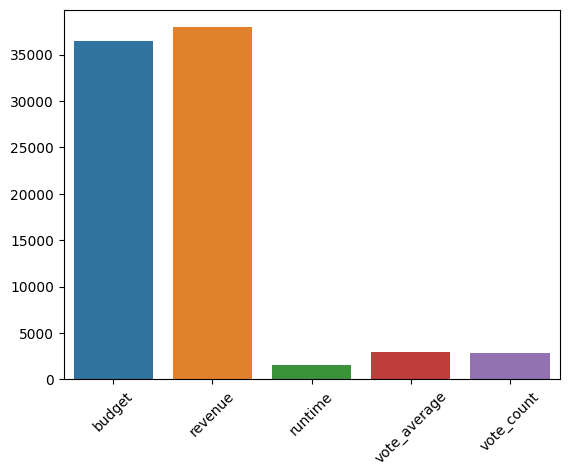

In [26]:
int_col = ['budget','revenue','runtime','vote_average','vote_count']
# count number of rows with zero value for each column
zero_counts = (df[int_col] == 0).sum()

# create a seaborn barplot to show the counts
sns.barplot(x=zero_counts.index, y=zero_counts.values)
plt.xticks(rotation = 45)
plt.show()

In [27]:
print('Zero percentage in budget :', df[df['budget'] == 0].shape[0]*100/df.shape[0])
print('Zero percentage in revenue :',df[df['revenue'] == 0].shape[0]*100/df.shape[0])

Zero percentage in budget : 80.42605742513122
Zero percentage in revenue : 83.68764609888413


Observations:
- The columns budget and revenue could be drop given the percentage of zero values due to lack of information. Unless this is treated upart.

#### Popularity distribution

In [28]:
px.box(df, y='popularity',title='Popularity', width= 800)

In [29]:
px.box(df[df['popularity'] <10], y='popularity',title='Popularity distribution for values under 10', width= 800)

In [30]:
print('Outliers percentage in popularity :',df[df['popularity'] > 10].shape[0]*100/df.shape[0])

Outliers percentage in popularity : 6.648877519516605


In [31]:
print(df[df['popularity'] > 100]['title'].nunique())
df[df['popularity'] > 100]['title'].unique()

16


array(['Pulp Fiction', 'The Dark Knight', 'Avatar', 'Gone Girl',
       'John Wick', 'Big Hero 6', 'The Hunger Games: Mockingjay - Part 1',
       'Pirates of the Caribbean: Dead Men Tell No Tales', 'Deadpool',
       'Guardians of the Galaxy Vol. 2', 'Captain America: Civil War',
       'Minions', 'Wonder Woman', 'Beauty and the Beast', 'Baby Driver',
       'War for the Planet of the Apes'], dtype=object)

Observations:
- Values range from 0 to almost 550
- 93% of the movies have popularity under 10
- 16 movies have popularity over 100

#### Vote_average & vote_count

In [32]:
px.box(df, y='vote_average',title='Ratings', width= 800)

In [33]:
px.violin(df, y='vote_average',title='Ratings', width= 800)

In [34]:
px.box(df, y='vote_count',title='Number of votes', width= 800)

In [35]:
px.box(df[df['vote_count'] < 100], y='vote_count',title='Number of votes distribution when votes under 100', width= 800)

In [36]:
print('Percentage of vote_count over 40:',df[df['vote_count'] > 40].shape[0]*100/df.shape[0])
print('Percentage of vote_count over 100:',df[df['vote_count'] > 100].shape[0]*100/df.shape[0])
print('Percentage of vote_count over 1000:',df[df['vote_count'] > 1000].shape[0]*100/df.shape[0])

Percentage of vote_count over 40: 22.7142416089622
Percentage of vote_count over 100: 13.264676046398801
Percentage of vote_count over 1000: 2.469898116702686


Observations:
- Most of the ratings range from 4 to 8, being 0 the lowest and 10 the highest
- vote_count ranges from 0 to 14k
- 22% of movies have over 40 votes, 13% over 100 and 2.5% over 1000


#### Runtime

In [37]:
px.box(df, y='runtime',title='Duration of the movie in min', width= 800)

In [38]:
df[(df['runtime'] > 400)].head()

,adult,budget,id,original_language,overview,popularity,release_date,revenue,runtime,status,tagline,title,vote_average,vote_count,release_year,collection,genres_name,production_companies_name,production_countries_name,spoken_languages_name
6747,0,0,42044,en,Claude Lanzmann directed this 9 1/2 hour docum...,1.978031,1985-11-01,0.0,566.0,Released,NaN,Shoah,8.7,36.0,1985,NaN,[Documentary],"[British Broadcasting Corporation (BBC), Minis...",[France],"[English, Français, Deutsch, עִבְרִית, Polski, ]"
8635,0,100000000,29266,ru,Seven-hour epic based on the eponymous book by...,2.604571,1966-03-14,0.0,422.0,Released,NaN,War and Peace,7.5,16.0,1966,NaN,"[War, Drama, History, Romance]",[Mosfilm],[Russia],"[Français, Deutsch, Magyar, Pусский]"
9117,0,0,30983,en,"Tom Hanks, Imagine Entertainment and HBO prese...",3.223150,1998-04-05,0.0,720.0,Released,NaN,From the Earth to the Moon,8.4,26.0,1998,Torrente Collection,"[Documentary, Drama]","[Imagine Entertainment, HBO]",[United States of America],[English]
9206,0,0,110147,en,Two centuries after Snow White and Cinderella ...,3.738876,2000-02-25,0.0,417.0,Released,NaN,The 10th Kingdom,7.5,51.0,2000,NaN,"[Adventure, Comedy, Family, Fantasy, Mystery, ...",[],"[Germany, United Kingdom, United States of Ame...","[English, Français, Deutsch]"
10031,0,1500000,31414,hu,"In a small, dilapidated village in 1990s Hunga...",7.515086,1994-02-08,0.0,450.0,Released,NaN,Satantango,8.1,56.0,1994,NaN,[Drama],"[Von Vietinghoff Filmproduktion, Vega Film, Té...","[Germany, Hungary, Switzerland]",[Magyar]


In [39]:
len(df[(df['runtime'] > 400)])

50

In [40]:
px.box(df[df['runtime'] < 200], y='runtime',title='Duration of the movie in min', width= 800)

Observations:
- The variable goes from 0 to 1256 min. Studying the titles, if they last more than 400 min, is not a movie but rather a mini series.
- Under the previous consideration, there is 50 mini series in the df
- 75% of the movies last less than 106 min
- This variable can be divided in values between 0-85, 85-110, over 110, droping mini series

#### Release year

In [41]:
px.box(df, y='release_year',title='Release year', width= 800)

In [42]:
df['release_year'].quantile(0.35)

1990.0

In [43]:
print('Before 1990',df[(df['release_year'] < 1990)].shape[0],'movies were released')
print('Between 1990 and 2010',df[(df['release_year'] > 1990) & (df['release_year'] < 2010)].shape[0], 'movies were released')
print('After 2000',df[(df['release_year'] > 2000)].shape[0], 'movies were released')

Before 1990 15682 movies were released
Between 1990 and 2010 16444 movies were released
After 2000 23201 movies were released


Observations:
- 25% of the movies were released before 1978, 35% before 1990
- 75% before 2010

### Categorical columns

#### Production companies

Number of production companies distribution

In [44]:
px.box(df.production_companies_name.apply(lambda x: len(x)))

In [45]:
n_companies = df.production_companies_name.apply(lambda x: len(x))
(n_companies[n_companies > 5].count())*100/df.shape[0]

3.14470956644467

In [46]:
#Movies each company produced
companies = pd.Series(df.explode('production_companies_name')['production_companies_name']).value_counts()

In [47]:
companies = companies.rename_axis('companies').reset_index(name='count')
companies

,companies,count
0,Warner Bros.,1250
1,Metro-Goldwyn-Mayer (MGM),1074
2,Paramount Pictures,1001
3,Twentieth Century Fox Film Corporation,836
4,Universal Pictures,830
...,...,...
23528,Zhi Media,1
23529,China Blue Productions,1
23530,Arts Council of Wales,1
23531,Hamilton-Mehta Productions,1


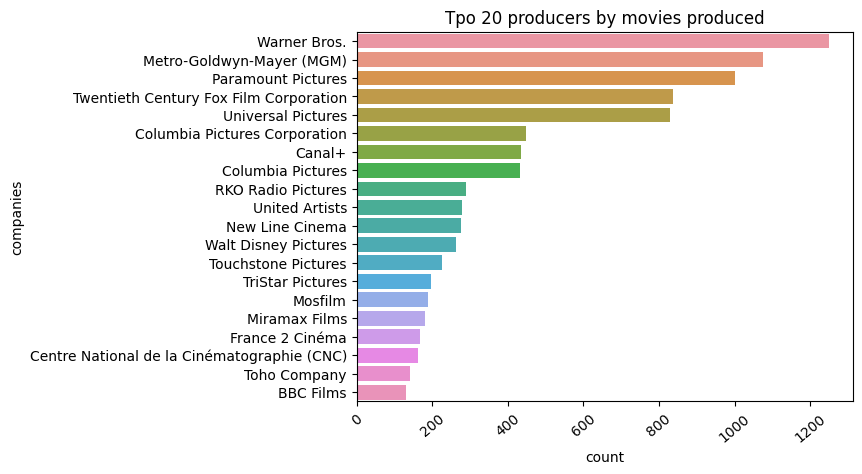

In [48]:
sns.barplot(companies[0:20], x= 'count', y ='companies',orient='h')
plt.xticks(rotation = 40)
plt.title('Tpo 20 producers by movies produced')
plt.show()

In [49]:
list(companies[0:8]['companies'])

['Warner Bros.',
 'Metro-Goldwyn-Mayer (MGM)',
 'Paramount Pictures',
 'Twentieth Century Fox Film Corporation',
 'Universal Pictures',
 'Columbia Pictures Corporation',
 'Canal+',
 'Columbia Pictures']

Observations:
- 3% of the movies have more than 5 production companies 
- The number of production companies per movie range from 0 to 26

#### Production countries

In [50]:
px.box(df.production_countries_name.apply(lambda x: len(x)))

In [51]:
n_countries = df.production_countries_name.apply(lambda x: len(x))
(n_countries[n_countries > 3].count())*100/df.shape[0]

1.495170467075376

In [52]:
#Movies each company produced
countries = pd.Series(df.explode('production_countries_name')['production_countries_name']).value_counts()

In [53]:
countries = countries.rename_axis('countries').reset_index(name='count')
countries

,countries,count
0,United States of America,21134
1,United Kingdom,4088
2,France,3931
3,Germany,2249
4,Italy,2165
...,...,...
155,Madagascar,1
156,Somalia,1
157,Kuwait,1
158,Martinique,1


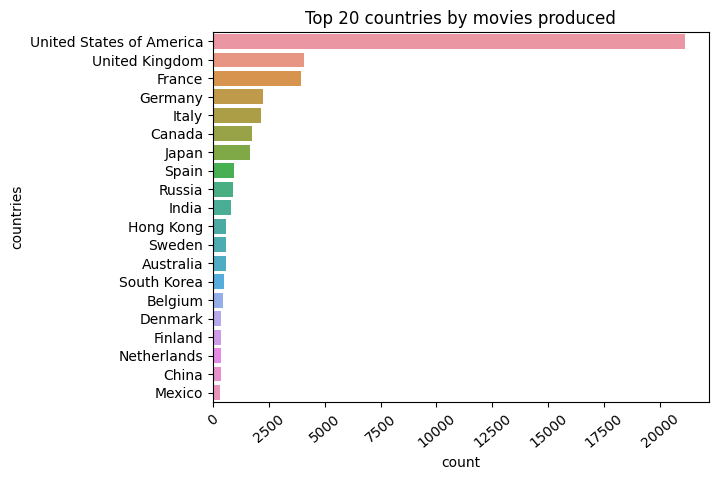

In [54]:
sns.barplot(countries[0:20], x= 'count', y ='countries',orient='h')
plt.xticks(rotation = 40)
plt.title('Top 20 countries by movies produced')
plt.show()

Observations:
- The number of production countries range from 0 to 25
- 1% of the movies have more than 3 production countries

#### Adult column

In [55]:
#Adult has True and False values. Count True values
df[df['adult'] == 1].shape[0]

8

Observations: highly unbalenced, only 8 True values. Must be drop.

#### Status

In [56]:
px.histogram(df,x='status')

Observations:
- Only movies with released and post production status can be kept and drop this column

#### Genres

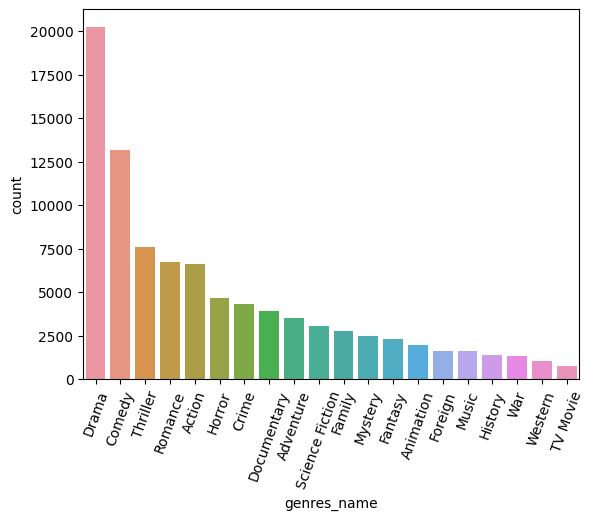

In [57]:
sns.countplot(x='genres_name',data=explode_df,order=explode_df['genres_name'].value_counts().index)
plt.xticks(rotation=70)
plt.show()

#### Original language

In [58]:
lang = pd.Series(df['original_language'].value_counts()).rename_axis('language').reset_index(name='count')
lang[lang['count'] > 100]


,language,count
0,en,32184
1,fr,2435
2,it,1528
3,ja,1346
4,de,1077
5,es,992
6,ru,822
7,hi,508
8,ko,444
9,zh,408


In [59]:
px.bar(lang[lang['count'] > 100], x='language', y='count')

In [60]:
print('Percentage of english movies:' ,len(df[df['original_language'] == 'en'])*100/len(df))
print('Percentage of french movies:' ,len(df[df['original_language'] == 'fr'])*100/len(df))
print('Percentage of italian movies:' ,len(df[df['original_language'] == 'it'])*100/len(df))
print('Percentage of japanese movies:' ,len(df[df['original_language'] == 'ja'])*100/len(df))

Percentage of english movies: 70.97428659639219
Percentage of french movies: 5.369823137652714
Percentage of italian movies: 3.3696467163586643
Percentage of japanese movies: 2.968288272394478


#### Spoken languages

In [61]:
df['n_spoken_languages'] = df.spoken_languages_name.apply(lambda x: len(x))

In [62]:
px.box(df, y='n_spoken_languages',title='Number of languages spoken', width= 800)

In [63]:
len(df[df['n_spoken_languages'] == 1])*100/len(df)

74.29762272306267

Observations:
- The number of spoken languages range from 0 to 19, being 1 the 75% of them

### Text values

Create needed functions to analyze the text within the columns

In [64]:
stop_words = set(stopwords.words("english"))
stop_words.update('-')

#create function to get a DataFrame
def get_df_w(input_col):

    df = (input_col.str.split(expand=True)#create df with a column for word in each row
                .apply(lambda x: pd.Series(x.unique()), axis=1)#get unique values for each row
              .stack()#turn into Series of words
              .str.lower()#transform words in Series to lowercase
              .value_counts()#count unique values
              .rename_axis('words')
              .reset_index(name='count'))
    
    #remove stop words
    df = df[~df['words'].isin(stop_words)]
    
    return df

#create function to get a color dictionary
def get_colordict(palette,number,start):
    pal = list(sns.color_palette(palette=palette, n_colors=number).as_hex())
    color_d = dict(enumerate(pal, start=start))
    return color_d

Function to plot grouping bubbles

In [65]:
def plot_circles(df):
    
    # compute circle positions:
    circles = circlify.circlify(df['count'][0:30].tolist(), 
                                show_enclosure=False, 
                                target_enclosure=circlify.Circle(x=0, y=0)
                            )
    n = df['count'][0:30].max()
    color_dict = get_colordict('RdYlBu_r',n ,1)

    # create figure
    fig, ax = plt.subplots(figsize=(9,9), facecolor='white')
    ax.axis('off')
    lim = max(max(abs(circle.x)+circle.r, abs(circle.y)+circle.r,) for circle in circles)
    plt.xlim(-lim, lim)
    plt.ylim(-lim, lim)

    # list of labels
    labels = list(df['words'][0:30])
    counts = list(df['count'][0:30])
    labels.reverse()
    counts.reverse()

    # plot circles
    for circle, label, count in zip(circles, labels, counts):
        x, y, r = circle
        ax.add_patch(plt.Circle((x, y), r, alpha=0.9, color = color_dict.get(count)))
        plt.annotate(label +'\n'+ str(count), (x,y), size=12, va='center', ha='center')
    plt.xticks([])
    plt.yticks([])
    plt.show()

#### Title column

In [66]:
df_words = get_df_w(df['title'])
df_words[0:20]

,words,count
6,man,638
7,love,630
12,&,448
13,story,392
15,night,380
16,life,376
17,last,343
22,2,325
24,girl,295
25,dead,276


Plot by genres

In [67]:
mask0 = df['genres_name'].apply(lambda x: 'Drama' in [p for p in x])
df_drama = get_df_w(df[mask0]['title'])

mask1 = df['genres_name'].apply(lambda x: 'Comedy' in [p for p in x])
df_comedy = get_df_w(df[mask1]['title'])

mask2 = df['genres_name'].apply(lambda x: 'Thriller' in [p for p in x])
df_thriller = get_df_w(df[mask2]['title'])

mask3 = df['genres_name'].apply(lambda x: 'Action' in [p for p in x])
df_action = get_df_w(df[mask3]['title'])

In [68]:
mask4 = df['genres_name'].apply(lambda x: ['Drama','Comedy'] not in [p for p in x])
df_others = get_df_w(df[mask4]['title'])

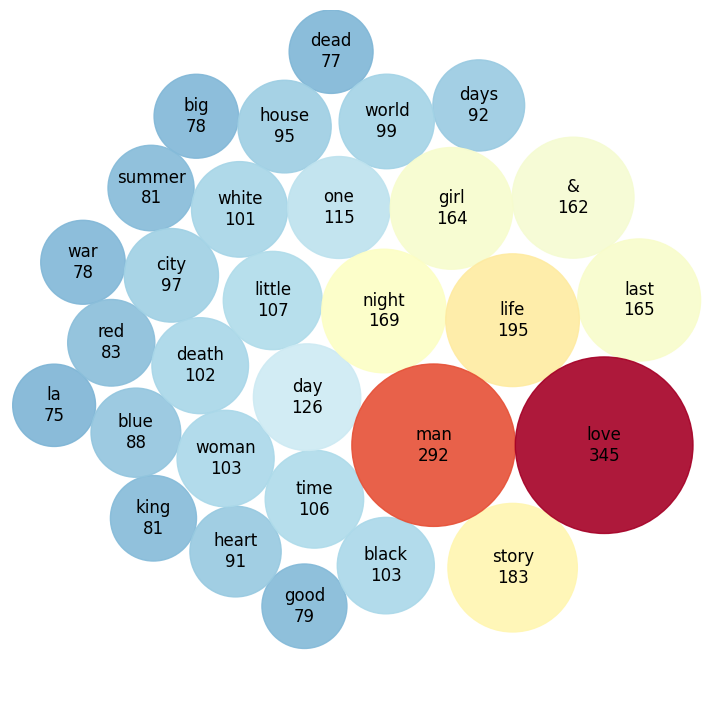

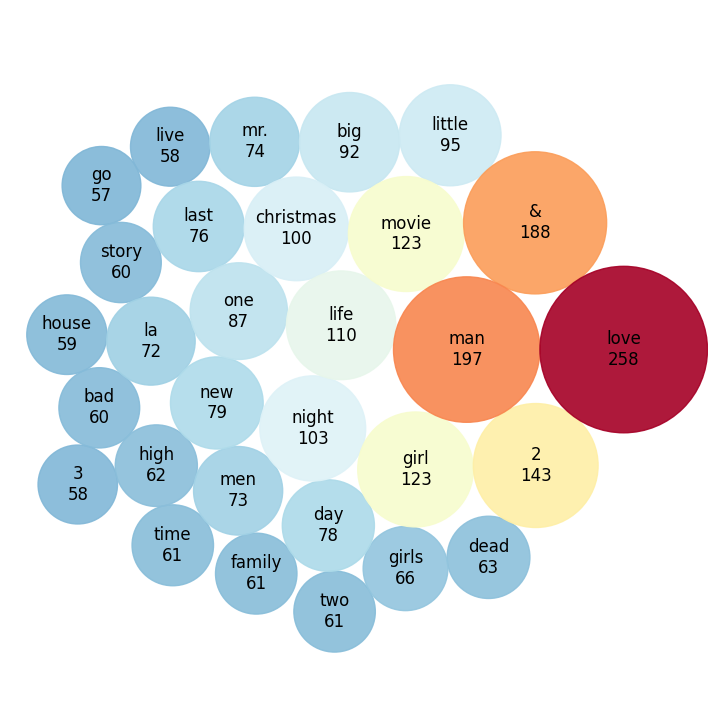

In [69]:
plot_circles(df_drama)
plot_circles(df_comedy)

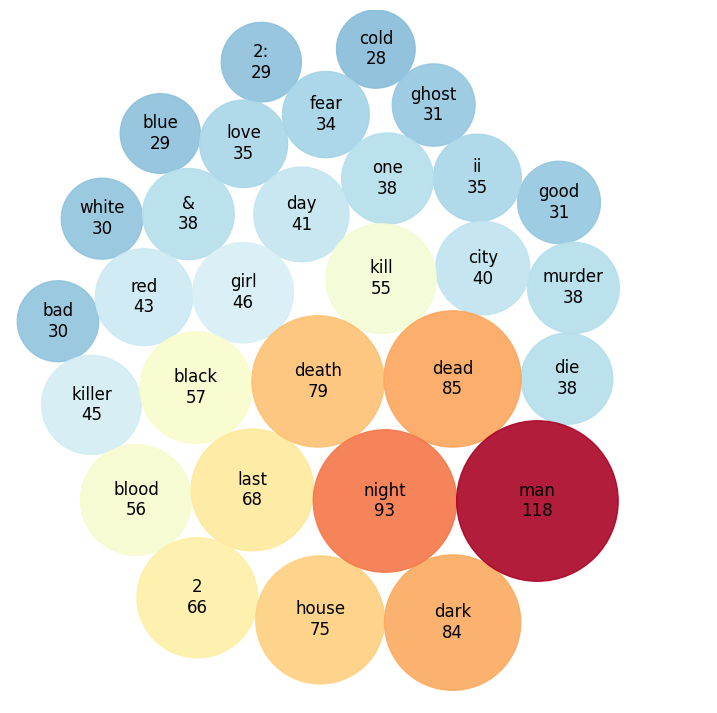

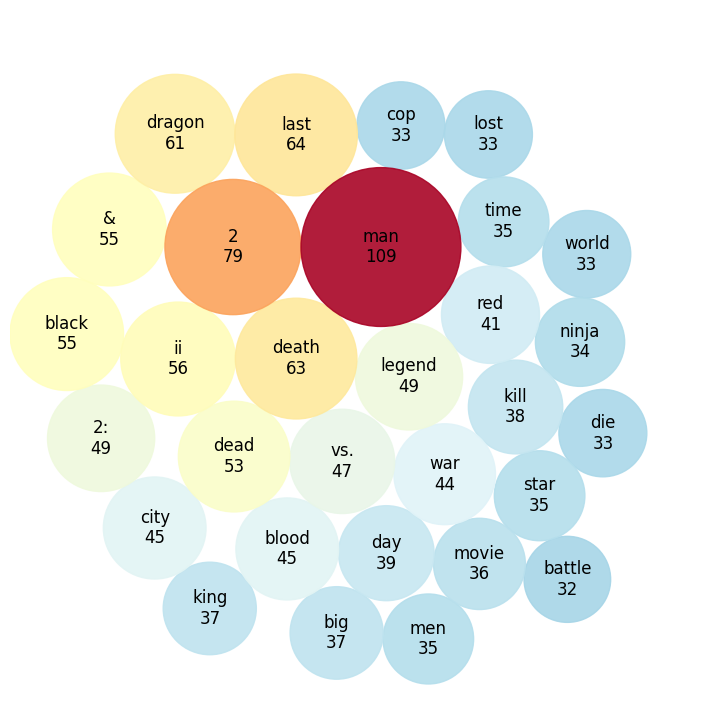

In [70]:
plot_circles(df_thriller)
plot_circles(df_action)

#### Overview column

In [71]:
df_words_over = get_df_w(df['overview'])
df_words_over[0:20]

,words,count
28,one,6107
31,young,5700
33,new,4962
38,two,4628
39,life,4588
41,film,3937
44,story,3694
45,man,3666
47,love,3406
48,find,3345


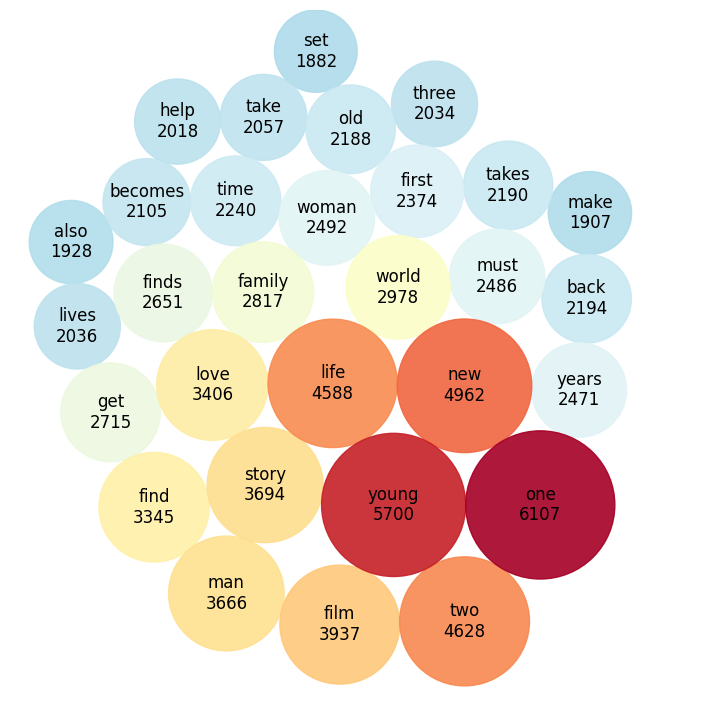

In [72]:
plot_circles(df_words_over)

In [73]:
#Mask to filter the values in release_time that do NOT contain '-' in their value
mask = df['overview'].str.contains(r'film', na=True)
#Row index of the mask
df[mask]['overview'][25]

'The evil Iago pretends to be friend of Othello in order to manipulate him to serve his own end in the film version of this Shakespeare classic.'

In [74]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 45346 entries, 0 to 45465
Data columns (total 21 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   adult                      45346 non-null  int64         
 1   budget                     45346 non-null  int64         
 2   id                         45346 non-null  object        
 3   original_language          45335 non-null  object        
 4   overview                   44405 non-null  object        
 5   popularity                 45346 non-null  float64       
 6   release_date               45346 non-null  datetime64[ns]
 7   revenue                    45346 non-null  object        
 8   runtime                    45100 non-null  float64       
 9   status                     45266 non-null  object        
 10  tagline                    20387 non-null  object        
 11  title                      45346 non-null  object        
 12  vote_aver

### Correlation

Text(0.5, 1.0, 'Variables correlation')

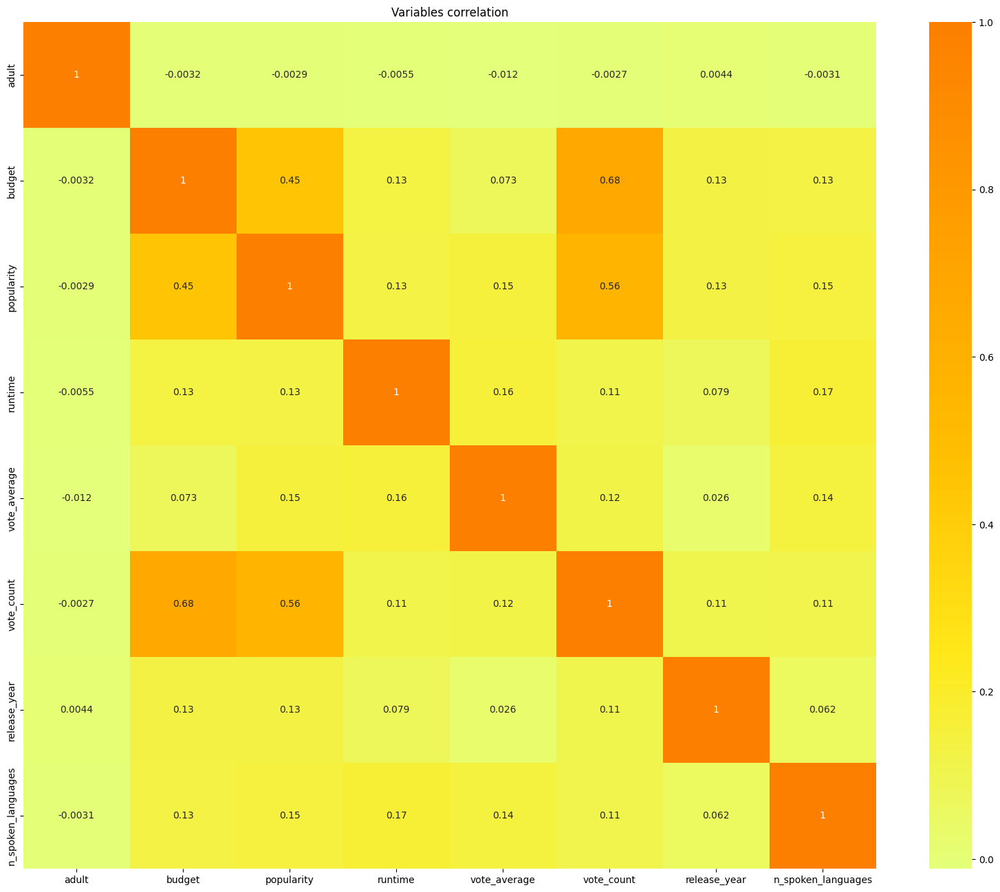

In [75]:
plt.rcParams['figure.figsize'] = (20, 16)
#Correlation for numeric variables
num_col = ['adult','budget','popularity','runtime','vote_average','vote_count','release_year','n_spoken_languages']
sns.heatmap(df[num_col].corr(), annot = True, cmap = 'Wistia')
plt.title('Variables correlation')

### Conlusions

Given the previous insight the following transformations will follow.
- Drop columns: 'adult', 'budget','release_date','revenue','spoken_languages_name','production_countries_name'(high correlation with original language)
- Drop rows based on: 'status'(not released or post production),'runtime'(over 400)
- Drop 'status'
- Transform to bivariate: 'tagline','collection','n_spoken_languages'(1 or many),'production_companies_name'(hihg and low), 'popularity'(over 10)
- Discretize: 'original_language'(5),'runtime'(3)
- Weighted average: 'vote_average', 'vote_count'
- Transform into list of words: 'overview','title'

# Preprocessing

## Drop columns & rows

In [76]:
#Drop columns
df_ml = df.drop(columns= ['adult', 'budget','release_date','revenue','spoken_languages_name','production_countries_name','id'])
#Drop rows
df_ml = df_ml[df_ml['status'].isin(['Released','Post Production'])]#Filter by status
df_ml = df_ml[df_ml['runtime'] < 400]#Filter by runtime
df_ml.drop(columns = 'status', inplace=True)
df_ml.head()

,original_language,overview,popularity,runtime,tagline,title,vote_average,vote_count,release_year,collection,genres_name,production_companies_name,n_spoken_languages
0,en,"Led by Woody, Andy's toys live happily in his ...",21.946943,81.0,NaN,Toy Story,7.7,5415.0,1995,Toy Story Collection,"[Animation, Comedy, Family]",[Pixar Animation Studios],1
1,en,When siblings Judy and Peter discover an encha...,17.015539,104.0,Roll the dice and unleash the excitement!,Jumanji,6.9,2413.0,1995,NaN,"[Adventure, Fantasy, Family]","[TriStar Pictures, Teitler Film, Interscope Co...",2
2,en,A family wedding reignites the ancient feud be...,11.712900,101.0,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,6.5,92.0,1995,Grumpy Old Men Collection,"[Romance, Comedy]","[Warner Bros., Lancaster Gate]",1
3,en,"Cheated on, mistreated and stepped on, the wom...",3.859495,127.0,Friends are the people who let you be yourself...,Waiting to Exhale,6.1,34.0,1995,NaN,"[Comedy, Drama, Romance]",[Twentieth Century Fox Film Corporation],1
4,en,Just when George Banks has recovered from his ...,8.387519,106.0,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,5.7,173.0,1995,Father of the Bride Collection,[Comedy],"[Sandollar Productions, Touchstone Pictures]",1


## Discrete bivariate

In [77]:
#Tagline
df_ml['tagline'] = df_ml['tagline'].fillna('tagno')
df_ml['tagline'] = df_ml['tagline'].apply(lambda x: 'tagsi' if x != 'tagno' else x)

In [78]:
#Belongs to collection
df_ml['collection'] = df_ml['collection'].fillna('collno')
df_ml['collection'] = df_ml['collection'].apply(lambda x: 'collsi' if x != 'collno' else x)

In [79]:
#Number of spoken languages
df_ml['n_spoken_languages'] = df_ml['n_spoken_languages'].apply(lambda x: 'spkone' if x == 1 else 'spkmany')

In [80]:
#Production companies
#List of companies with more than 400 movies produced
top_companies = list(companies[0:8]['companies'])

#Funtion to verified if the row of production companies contains one of the top companies
def contains_company(row):
    for item in row:
        if item in top_companies:
            return 'highcia'
    return 'lowcia'

df_ml['production_companies_name'] = df_ml['production_companies_name'].apply(contains_company)

In [81]:
#Popularity
df_ml['popularity'] = df_ml['popularity'].apply(lambda x: 'popyes' if x > 10 else 'popno')

## Discrete multi categories

In [82]:
#Funtion to transform original language
def discrete_language(row):
    '''
    Given the original language returns a category
    '''
    top_lang = {
        'en': 'lgen',
        'fr': 'lgfr',
        'it': 'lgit',
        'ja': 'lgja',
       }
    
    return top_lang.get(row, 'lgoth')

df_ml['original_language'] = df_ml['original_language'].apply(discrete_language)

In [83]:
#Runtime

def discrete_runtime(row):
    if row <= 85:
        return 'run85'
    elif row <= 110:
        return 'run110'
    else:
        return 'run400'

df_ml['runtime'] = df_ml['runtime'].apply(discrete_runtime)

## List of words

### Title

In [84]:
#Function to extract keywords in text
def text_nlp (row, lista):
    new_title = ''
    for palabra in (row).lower().split(sep= ' '):
        if palabra in lista:
            new_title += palabra + ' '
    return (new_title)

#List of words with frequency higher than 5 in title
title_top = list(df_words[df_words['count'] > 5]['words'])

#Create transform column
df_ml['new_title'] = df_ml['title'].apply(text_nlp, lista = title_top)

### Overview

In [85]:
#List of words with frequency higher than 2000 in overview
over_top = df_words_over[df_words_over['count'] > 2000]

#Create transform column
df_ml['overview'].fillna(value = 'emptyempty', inplace = True)
df_ml['new_over'] = df_ml['overview'].apply(text_nlp, lista = over_top)

### Genres

In [86]:
#Function to transform list to str
def list_str (row):
    new_list = ''
    if type(row) != list:
        return ''
    for palabra in row:
        new_list += palabra.lower() + ' '
    return (new_list)

df_ml['new_genre'] = df_ml['genres_name'].apply(list_str)

## New column soup

In [87]:
#Assign more weight to the genre column
df_ml['new_genre'] = df_ml['new_genre'].apply(lambda x: x*4)

In [88]:
#Selected columns to add to soup
col = ['original_language', 'popularity', 'runtime', 'tagline',
       'collection','production_companies_name', 'n_spoken_languages',
       'new_title', 'new_over', 'new_genre']
#Create soup column
df_ml['soup'] = df_ml[col].apply(lambda x: ' '.join(x), axis=1)

In [90]:
#df_ml.to_csv('data/movies_ml.csv', index = False)